In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from itertools import product
from typing import List
from tqdm.auto import tqdm
from humanize import naturalsize

In [2]:
from epigenomic_dataset import load_epigenomes

cell_line = "GM12878"
window_size = 200

promoters_epigenomes, promoters_labels = load_epigenomes(
    cell_line = cell_line,
    dataset = "fantom",
    regions = "promoters",
    window_size = window_size
)

enhancers_epigenomes, enhancers_labels = load_epigenomes(
    cell_line = cell_line,
    dataset = "fantom",
    regions = "enhancers",
    window_size = window_size
)

promoters_epigenomes = promoters_epigenomes.droplevel(1, axis=1) 
enhancers_epigenomes = enhancers_epigenomes.droplevel(1, axis=1) 

epigenomes = {
    "promoters": promoters_epigenomes,
    "enhancers": enhancers_epigenomes
}

In [3]:
from ucsc_genomes_downloader import Genome
from keras_bed_sequence import BedSequence

def to_bed(data:pd.DataFrame)->pd.DataFrame:
    """Return bed coordinates from given dataset."""
    return data.reset_index()[data.index.names]

def one_hot_encode(genome:Genome, data:pd.DataFrame, nucleotides:str="actg")->np.ndarray:
    return np.array(BedSequence(
        genome,
        bed=to_bed(data),
        nucleotides=nucleotides,
        batch_size=1
    ))

def flat_one_hot_encode(genome:Genome, data:pd.DataFrame, window_size:int, nucleotides:str="actg")->np.ndarray:
    return one_hot_encode(genome, data, nucleotides).reshape(-1, window_size*4).astype(int)


def to_dataframe(x:np.ndarray, window_size:int, nucleotides:str="actg")->pd.DataFrame:
    return pd.DataFrame(
        x,
        columns = [
            f"{i}{nucleotide}"
            for i in range(window_size)
            for nucleotide in nucleotides
        ]
    )

genome = Genome("hg19")

sequences = {
    region: to_dataframe(
        flat_one_hot_encode(genome, data, window_size),
        window_size
    )
    for region, data in epigenomes.items()
}

In [4]:
from sklearn.impute import KNNImputer

def knn_imputer(x:np.array)->np.ndarray:
    return KNNImputer(n_neighbors=x.shape[0]//10).fit_transform(x)

In [5]:
from sklearn.preprocessing import RobustScaler

def scale(x:np.ndarray)->np.ndarray:
    return RobustScaler().fit_transform(x)

In [7]:
from sklearn.kernel_approximation import Nystroem, RBFSampler

def nystroem(x:np.array)->np.array:
    return Nystroem(random_state=42, n_components=300).fit_transform(x)

def monte_carlo(x:np.array)->np.array:
    return RBFSampler(random_state=42, n_components=300).fit_transform(x)

def linear(x:np.array)->np.array:
    return x

In [19]:
from tsnecuda import TSNE

def tsne(x:np.array)->np.array:
    return TSNE(verbose=True, perplexity=1000, n_iter=3000, device=3).fit_transform(x)

In [10]:
from sklearn.decomposition import PCA

def pca(x:np.array)->np.array:
    return PCA(n_components=2).fit_transform(x)

In [11]:
from prince import MFA

def mfa(x:pd.DataFrame, n_components:int=2, nucleotides:str='actg')->np.ndarray:
    return MFA(groups={
        nucleotide: [
            column
            for column in x.columns
            if nucleotide in column
        ]
        for nucleotide in nucleotides
    }, n_components=n_components, random_state=42).fit_transform(x)

In [12]:
def decompose_all(x:np.ndarray):
    decompositions = (pca, tsne)
    kernels = (linear, nystroem)
    return [
        (decomposition(kernel(x)), f"{decomposition.__name__.upper()} - {kernel.__name__.capitalize()} Kernel")
        for decomposition, kernel in tqdm(
            product(decompositions, kernels),
            total=len(decompositions)*len(kernels),
            desc="Computing decompositions",
            leave=False
        )
    ]

In [13]:
def visualize(x:np.ndarray, y:np.ndarray, title:str):
    x = scale(knn_imputer(x))
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(40,10))
    colors = np.array(["tab:blue", "tab:orange"])[y.ravel()]
    for (decomposition, subtitle), axis in zip(decompose_all(x), axes.ravel()):
        axis.scatter(*decomposition.T, s=1, color=colors)
        axis.set_title(f"{title} - {subtitle}")
    fig.tight_layout()
    fig.show()

In [14]:
features = promoters_epigenomes.shape[1]

embedded_enhancers = mfa(sequences["enhancers"], n_components=features)
embedded_promoters = mfa(sequences["promoters"], n_components=features)

In [20]:
tasks = {
    "Enhancers - Epigenomic data": [
        enhancers_epigenomes.values,
        enhancers_labels.values
    ],
    "Promoters - Epigenomic data": [
        promoters_epigenomes.values,
        promoters_labels.values
    ],
    "Enhancers - Sequence data": [
        embedded_enhancers,
        enhancers_labels.values
    ],
    "Promoters - Sequence data": [
        embedded_promoters,
        promoters_labels.values
    ],
    "Promoters vs Enhancers - Sequence data": [
        np.vstack([embedded_enhancers, embedded_promoters]),
        np.vstack([np.ones_like(enhancers_labels.values), np.zeros_like(promoters_labels.values)])
    ],
    "Enhancers - Sequence and Epigenomic data": [
        np.hstack([enhancers_epigenomes.values, embedded_enhancers]),
        enhancers_labels.values
    ],
    "Promoters - Sequence and Epigenomic data": [
        np.hstack([promoters_epigenomes.values, embedded_promoters]),
        promoters_labels.values
    ],
}

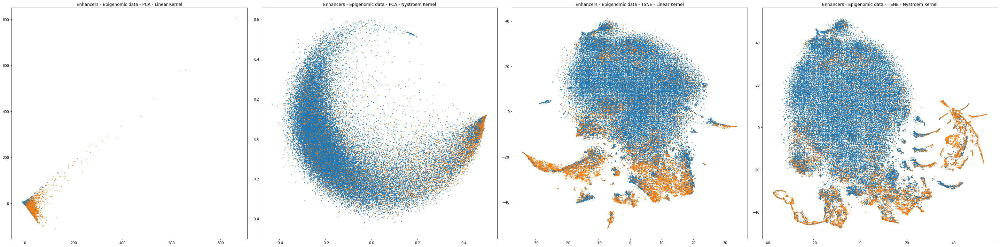

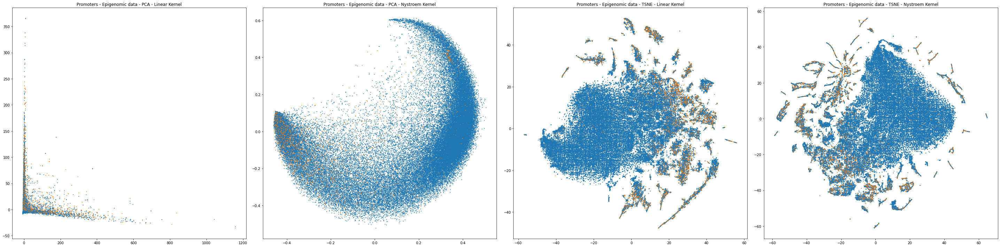

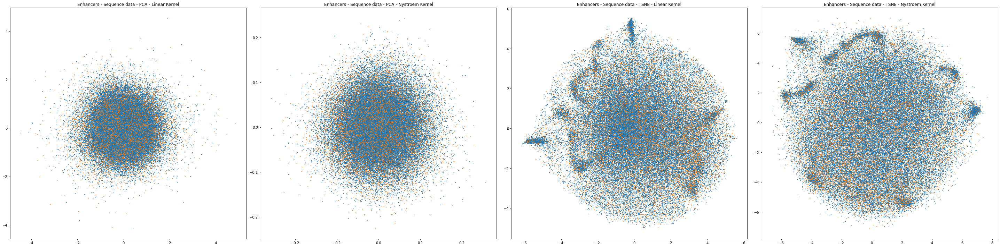

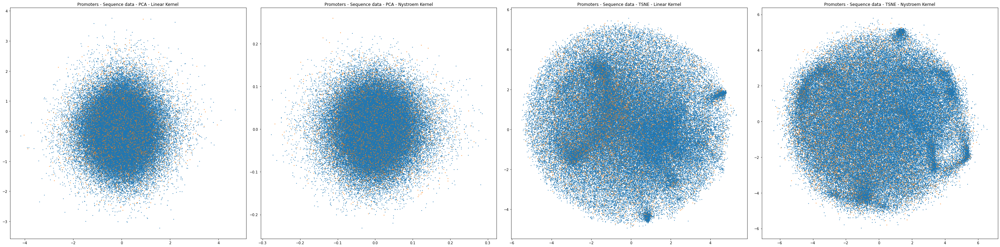

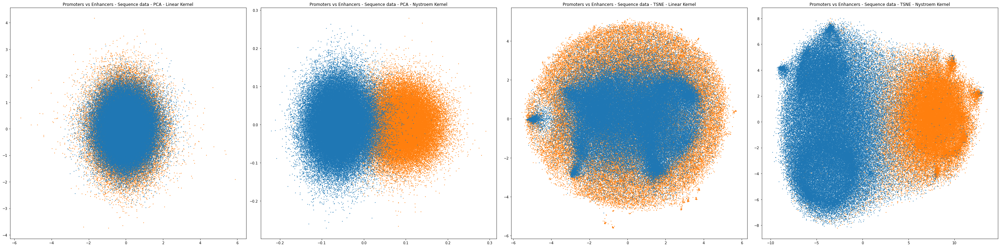

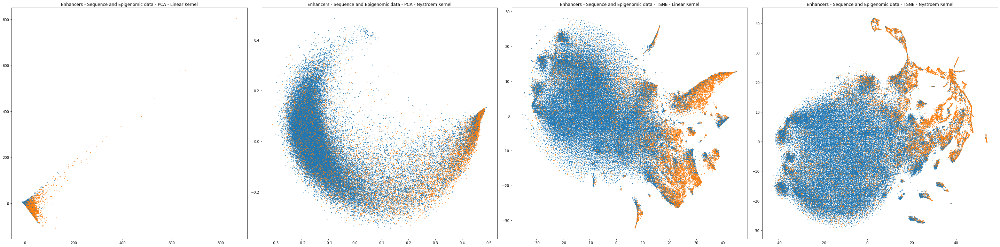

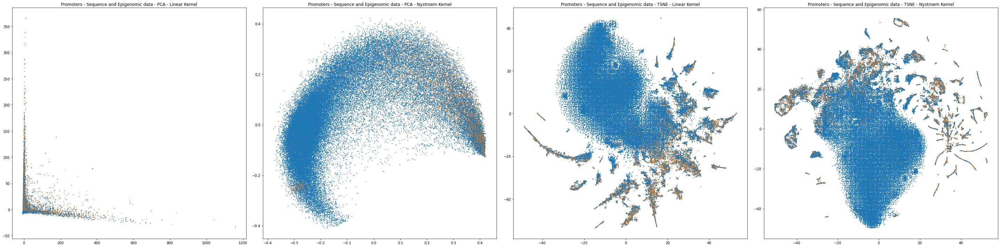

In [21]:
for title, (X, y) in tqdm(tasks.items(), total=len(tasks), desc="Plotting tasks"):
    visualize(X, y, title)